# ECE590: Smart Cameras Homework 4
## Nathan Inkawhich
**Duke University Spring 2019**

This notebook will handle the camera interfacing portion of HW4. Here we will use the DNN trained in the DNNTraining notebook.

In [3]:
import time
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import subprocess
import skimage
import skimage.io as imio
import skimage.transform as trans
from skimage.viewer import ImageViewer
#import glob
import re
from time import gmtime, strftime, sleep
import time
%matplotlib inline
mpl.rcParams['figure.figsize'] = (10.0, 6.0) 

/Users/nathaninkawhich/anaconda/envs/tensorflow_p36/lib/python3.6/site-packages/skimage/viewer/utils/core.py:10: UserWarning: Recommended matplotlib backend is `Agg` for full skimage.viewer functionality.
  warn("Recommended matplotlib backend is `Agg` for full "


**Test that we can talk to the camera**

Since this is a new camera, we must first create a ssh-key on our host computer then share the key with the IPCamera so we can fluidly send commands. If this line works, the ssh-key pairing was successful.

In [4]:
subprocess.run("ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 'ls'", stdout=subprocess.PIPE, shell=True)

CompletedProcess(args="ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 'ls'", returncode=0, stdout=b'aqueti\nbin\ncuda-l4t\ncudnn\ndbGrab_30402_s01_00000.jpg\nDesktop\nDocuments\nDownloads\nexamples.desktop\ninkGrab_31005_s00_00000.jpg\njetson_clocks.sh\nMusic\nnv-gie-repo-ubuntu1604-ga-cuda8.0-trt2.1-20170614_1-1_arm64.deb\nOpenCV4Tegra\nPictures\nPublic\nreport_ip_to_host.sh\nsrc\ntegra_multimedia_api\ntegrastats\nTemplates\nVideos\n')

## Camera helper functions

These are the same helpers we have been using since homework 2 to grab an image from the camera, reset the camera focus position, and move the camera focus position. The only changes are to send the commands to the new camera by changing the IP address to ```10.236.176.37```. 

In [5]:
# Take an image on the sensor and scp it to local machine
def grabImage(sid=0, imres=8):
    # I will use the file name inkGrab.... for the image grabbed from the camera. First step is to get rid of previously grabbed images
    subprocess.run('rm inkGrab*', stdout=subprocess.PIPE, shell=True)
    subprocess.run('ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "rm inkGrab*"', stdout=subprocess.PIPE, shell=True)
    # ok, now let's grab an image on the tegra
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "nvgstcapture-1.0 -m 1 --sensor-id '+str(sid)+' -A --capture-auto 1 --file-name inkGrab --image-res '+ str(imres)+'"'
    subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    subprocess.run('scp -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37:inkGrab* .', stdout=subprocess.PIPE, shell=True)
    #ok, now let's find the file name of the image we just grabbed and transfered 
    pop=subprocess.run('ls',stdout=subprocess.PIPE, shell=True)
    rePop=pop.stdout
    rePop=rePop.decode("utf-8")
    fileName = re.search(r'inkGrab(.*).jpg', rePop)
    fileName=fileName.group()
    pop=imio.imread(fileName)
    #pop=skimage.transform.rotate(pop,180)
    
    return pop
# Reset the focus point of the camera to the "zero" position
def resetFocus(sid=0):
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py '+str(sid+1)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout

# Move the relative focus point of the camera (position is stepped relative to current position)
def moveFocus(sid=0, step=100):
    cmD='ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py '+str(sid+1)+' '+str(step)+'"'
    pop=subprocess.run(cmD, stdout=subprocess.PIPE, shell=True)
    print(cmD)
    return pop.stdout


## Get Sample Image to Start

First lets make sure the camera interface functions work by grabbing an image from the camera and viewing it. In the assignment, it was described that the relevant step range for this scene is 1100-2000, since the reset position of the camera is 940, we step 160 units after reset to get to 1100. 

In [6]:
resetFocus()
time.sleep(2)
moveFocus(sid=0, step=160)
time.sleep(2)
tst_img = grabImage(imres=8)
print(tst_img.shape)

ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
(2160, 3840, 3)


Text(0.5,1,'Sample Image from Camera')

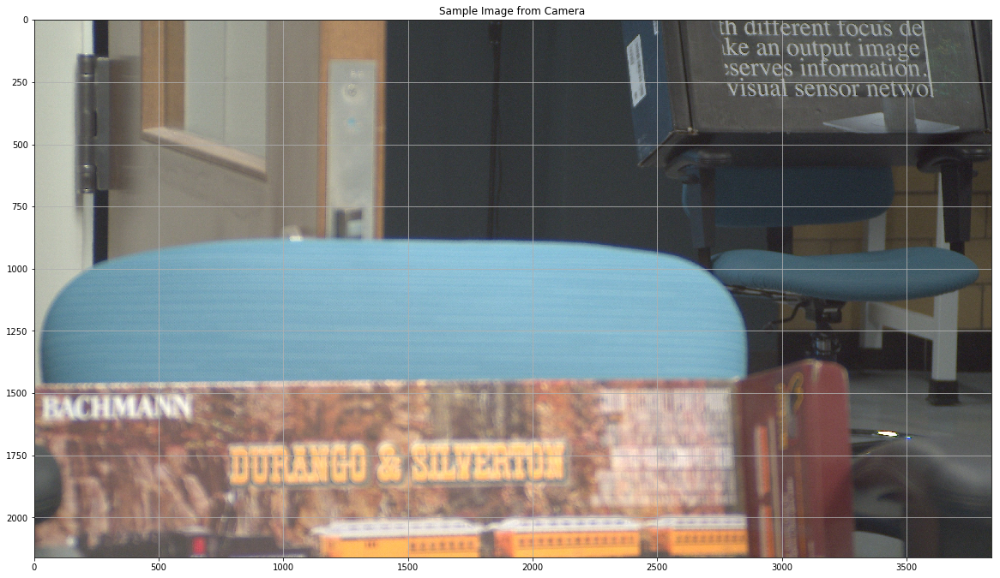

In [7]:
plt.figure(figsize=(20,20))
plt.imshow(tst_img)
plt.grid(True)
plt.title("Sample Image from Camera")

## Identify Regions of Interest (ROIs)

Now, since the neural focusing algorithm was trained on 256x256 patches, we must identify patches of the above image as Regions of Interest (ROIs). We will then have the DNN focus on each of these patches and see how the image changes. Here, we choose 5 ROIs from different regions of the image. Each includes a different color scheme and different textures for a unique challenge.

In [257]:
# Pick some regions of interest
clip_size=256

x1= 1600; y1=1000
x2= 0; y2=3000
x3= 600; y3=1100
x4= 1500; y4=300
x5= 1900; y5=2000

Text(0.5,1,'ROI 5')

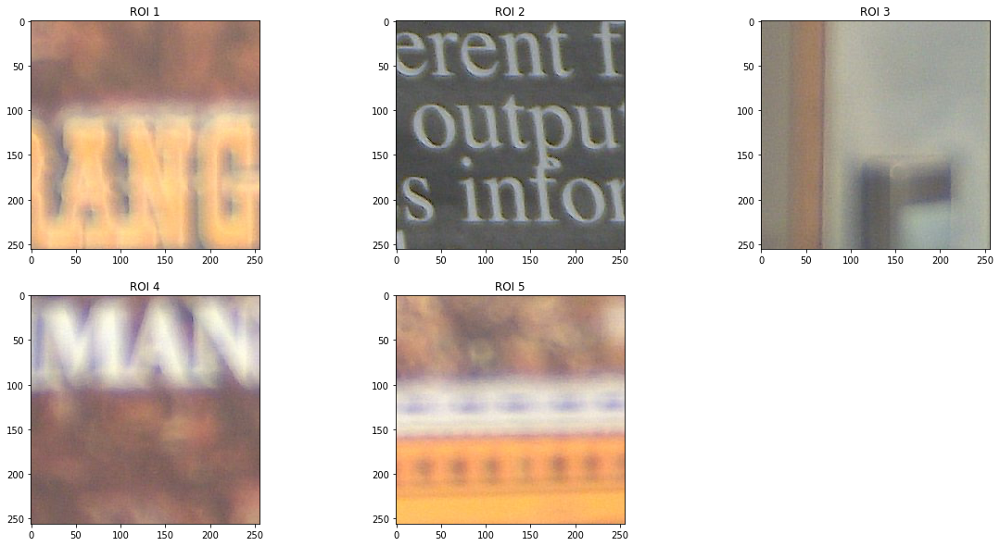

In [260]:
plt.figure(figsize=(20,10))
plt.subplot(2,3,1)
plt.imshow(np.copy(tst_img)[x1:x1+clip_size, y1:y1+clip_size])
plt.title("ROI 1")
plt.subplot(2,3,2)
plt.imshow(np.copy(tst_img)[x2:x2+clip_size, y2:y2+clip_size])
plt.title("ROI 2")
plt.subplot(2,3,3)
plt.imshow(np.copy(tst_img)[x3:x3+clip_size, y3:y3+clip_size])
plt.title("ROI 3")
plt.subplot(2,3,4)
plt.imshow(np.copy(tst_img)[x4:x4+clip_size, y4:y4+clip_size])
plt.title("ROI 4")
plt.subplot(2,3,5)
plt.imshow(np.copy(tst_img)[x5:x5+clip_size, y5:y5+clip_size])
plt.title("ROI 5")

From the above image, we see most of the ROIs are out of focus by an unknown amount. Each has a different image structure. However, ROI2 does not appear to be very out of focus. The next section will show how the DNN focuses on each of these patches.

## Auto Focus with DNN

**NOTE:** The DNN used here was trained in the "DNNTraining" notebook.


### Prepare DNN

The first step to using the DNN is to import the proper python libraries for tensorflow and keras.

In [88]:
import keras
import keras.callbacks
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Conv2DTranspose, UpSampling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras.optimizers as optimizers
from keras import backend as K
if K.backend()=='tensorflow':
    K.set_image_dim_ordering("th")

Next, load the model structure from the other notebook and initialialize it with the pretrained weights.

In [89]:
# Step Estimator Model from "Intelligent Auto Focus" paper
def step_estimator_model():
    model = Sequential()
    # CONV-1
    model.add(Conv2D(filters=4, kernel_size=6, strides=4, activation='relu', input_shape=(3,256,256)))
    # CONV-2
    model.add(Conv2D(filters=8, kernel_size=4, strides=4, activation='relu'))
    # CONV-3
    model.add(Conv2D(filters=8, kernel_size=4, strides=4, activation='relu'))
    # Flatten
    model.add(Flatten())
    # FC-1
    model.add(Dense(64, activation='relu'))
    # FC-2
    model.add(Dense(32, activation='relu'))
    # FC-3
    model.add(Dense(1))

    # Define training functions
    adam = optimizers.Adam(lr=0.0001)
    model.compile(loss='mean_squared_error', optimizer=adam)
    return model

In [90]:
# Initialize model
cnn = step_estimator_model()
cnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 4, 63, 63)         436       
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 8, 15, 15)         520       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 8, 3, 3)           1032      
_________________________________________________________________
flatten_2 (Flatten)          (None, 72)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 64)                4672      
_________________________________________________________________
dense_5 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 33        
Total para

In [91]:
# load pretrained weights
cnn.load_weights("./HW4_step_estimator_weights.hdf5")

**Set Camera at starting position 1100**

Next, before we start we can reset the camera to position 1100 and visualize to make sure we didnt break anything. This is just a sanity check.

In [190]:
print(resetFocus(sid=0))

ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
b"address is 0\nbusnumber is <smbus.SMBus object at 0x7faefa40b0>\nim initializing here\n['1']\nnow my address is 96\nnow my bus is 30\naddress is 96\nbusnumber is <smbus.SMBus object at 0x7faefa4170>\nim initializing here\ntrying to reset here\ntrying to build command here\n01010a0400\ndata part of command is [1, 1, 10, 4, 0]\nWidth        = 16\nPoly         = 0x1021\nReflectIn    = False\nXorIn        = 0x0000\nReflectOut   = False\nXorOut       = 0x0000\nAlgorithm    = UNDEFINED\n\ncrc is 216\nI think the full cmd should be [126, 215, 224, 1, 1, 10, 4, 0, 126]\nI2C: Writing list to register 0x60:\n[126, 215, 224, 1, 1, 10, 4, 0, 126]\n"


ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"


Text(0.5,1,'Starting Image from Camera Position 1100')

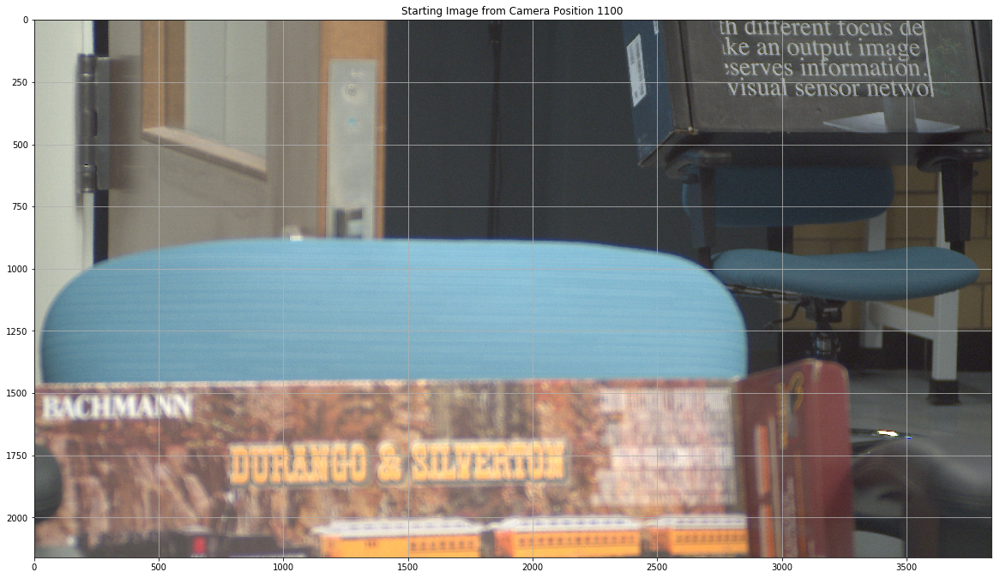

In [191]:
moveFocus(sid=0, step=160)
tst_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(tst_img)
plt.grid(True)
plt.title("Starting Image from Camera Position 1100")

### Auto Focus Function with DNN

Now we can write the function to auto focus an image with a DNN. The inputs to this are:

- **roix** - x coordinate of top-left corner of 256x256 patch
- **roiy** - y coordinate of top-left corner of 256x256 patch
- **num_attempts** - largest number of steps to take before the algorithm exits

Recall, the DNN was trained on 256x256 patches. So, the input to this function specifies the coordinate of the top left corner of this patch. Also, the output of the DNN is how many steps we should move the focus motor given the input image. Notice, this does not give a direction so we must look in both directions. The pseudocode for this algorithm is as follows:

```
1. Set the focus position to 1100
2. Grab the current full frame image and chip out the ROI
3. Forward pass the ROI through the DNN to get the predicted number of steps
4. Attempt to step back the predicted number of steps
    - if we can, move the focus motor
    - Capture a full frame and chip out the ROI
    - Forward pass ROI and get prediction
5. Attempt to step forward the predicted number of steps
    - if we can, move the focus motor
    - Capture a full frame and chip out the ROI
    - Forward pass ROI and get prediction
6. Move the camera in the direction with the smaller DNN prediction
7. Exit if prediction < threshold (i.e. exit if the ROI is focused "enough")
8. Repeat steps 2-7 until good ROI is found or for num_attempts 

return a history of ROIs, focus positions, and predicted values
```

In [231]:
def autofocus_dnn(roix, roiy, num_attempts):
    
    # Set focus position to absolute position = 1100 (as specified in assignment)
    print("Setting initial focus position")
    resetFocus(sid=0)
    time.sleep(3)
    moveFocus(sid=0, step=160)

    roi_hist = []
    position_hist = []
    prediction_hist = []
    
    abs_position = 1100
    clip_size=256
    
    # for the number of allowable attempts
    for a in range(num_attempts):
        
        # Grab the current full frame image at this position
        curr_img = grabImage(imres=8)
        # Isolate the ROI
        curr_roi = np.copy(curr_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
        
        # Get the rounded and bounded prediction
        pred = int(min(max(0,cnn.predict(np.expand_dims(curr_roi,axis=0))[0][0]),400))
        
        print("Attempt: {}/{}, AbsPos: {}, Pred: {}".format(a,num_attempts,abs_position,pred))
        
        # Update stat keepers
        roi_hist.append(np.copy(curr_roi))
        prediction_hist.append(pred)
        position_hist.append(abs_position)
        
        if pred < 20:
            print("Found a good focus point. Done")
            break
        
        # Set initial conditions
        curr_abs_position = abs_position
        step_backward_pred = 1e5
        step_forward_pred = 1e5
        
        # Try to step backwards
        if (abs_position-pred) > 1100:
            # Move backward the predicted steps
            moveFocus(sid=0, step=-pred)
            time.sleep(2)
            curr_abs_position -= pred
            # Grab the full frame at this position
            tmp_img = grabImage(imres=8)
            # Isolate the ROI
            tmp_roi = np.copy(tmp_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
            # Make a prediction at this new location
            step_backward_pred = int(min(max(0,cnn.predict(np.expand_dims(tmp_roi,axis=0))[0][0]),400))
        if (abs_position+pred) < 2000:
            # Move forward the predicted steps
            moveFocus(sid=0, step=(abs_position+pred-curr_abs_position))
            time.sleep(2)
            curr_abs_position = abs_position+pred
            # Grab the full frame at this position
            tmp_img = grabImage(imres=8)
            # Isolate the ROI
            tmp_roi = np.copy(tmp_img)[roix:roix+clip_size, roiy:roiy+clip_size].transpose(2,0,1)/255.
            # Make a prediction at this new location
            step_forward_pred = int(min(max(0,cnn.predict(np.expand_dims(tmp_roi,axis=0))[0][0]),400))
        if step_forward_pred == step_backward_pred:
            print("Both directions are bad, breaking")
            break
        elif step_forward_pred < step_backward_pred:
            print("Taking a step forward")
            abs_position = curr_abs_position
        else:
            print("Taking a step backward")
            if curr_abs_position == (abs_position + pred):
                # Move to correct position
                moveFocus(sid=0, step=-2*pred)
                time.sleep(2)
            elif curr_abs_position == abs_position:
                # Move to correct position
                moveFocus(sid=0, step=-pred)
                time.sleep(2)
            abs_position -= pred
        
    return roi_hist,prediction_hist,position_hist

## Test Auto Focus

The only thing left to do is test out the DNN autofocus algorithm on our ROIs.

### ROI-1

In [222]:
# Region 1
rx1= 1600; ry1=1000

rh,prh,poh = autofocus_dnn(rx1, ry1, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 151
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 151"
Taking a step forward
Attempt: 1/4, AbsPos: 1251, Pred: 0
Found a good focus point. Done


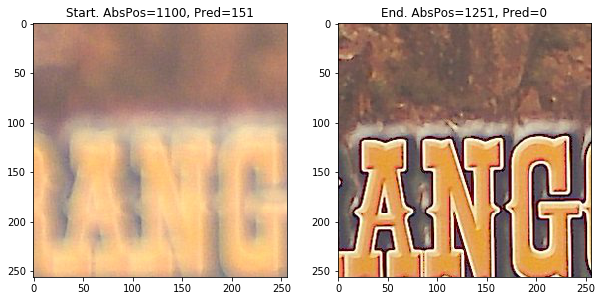

In [223]:
plt.subplot(1,2,1)
plt.imshow(rh[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh[0],prh[0]))
plt.subplot(1,2,2)
plt.imshow(rh[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh[-1],prh[-1]))
plt.show()

Text(0.5,1,'ROI-1 Focused Image')

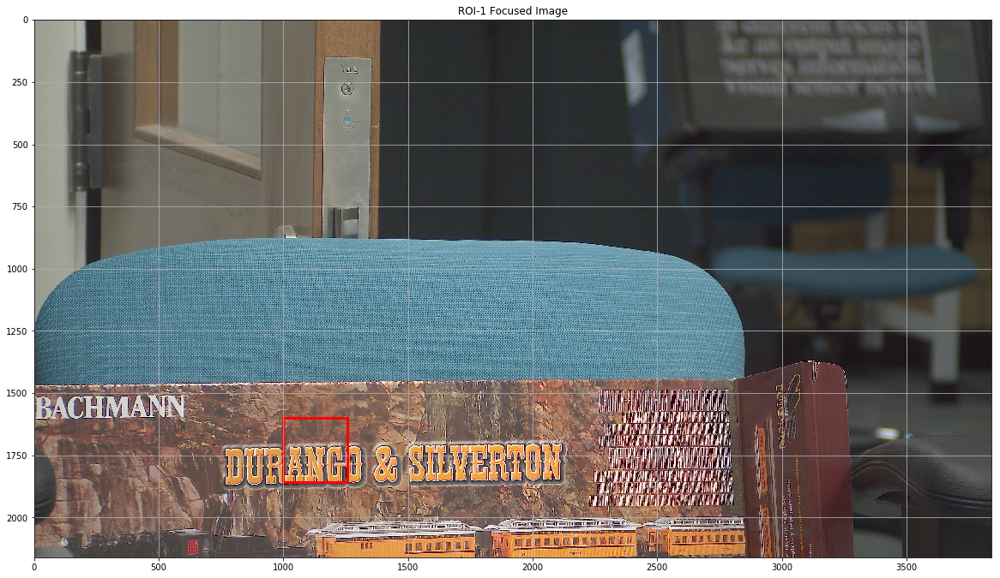

In [224]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry1, rx1),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-1 Focused Image")

The autofocus algorithm only needs one step to predict the correct value. The letters in the region are now sharp and readable.

### ROI-2

In [225]:
# Region 2
rx2= 0; ry2=3000

rh2,prh2,poh2 = autofocus_dnn(rx2, ry2, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 0
Found a good focus point. Done


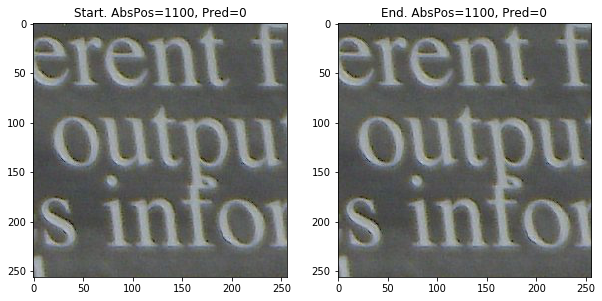

In [226]:
plt.subplot(1,2,1)
plt.imshow(rh2[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh2[0],prh2[0]))
plt.subplot(1,2,2)
plt.imshow(rh2[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh2[-1],prh2[-1]))
plt.show()

Text(0.5,1,'ROI-2 Focused Image')

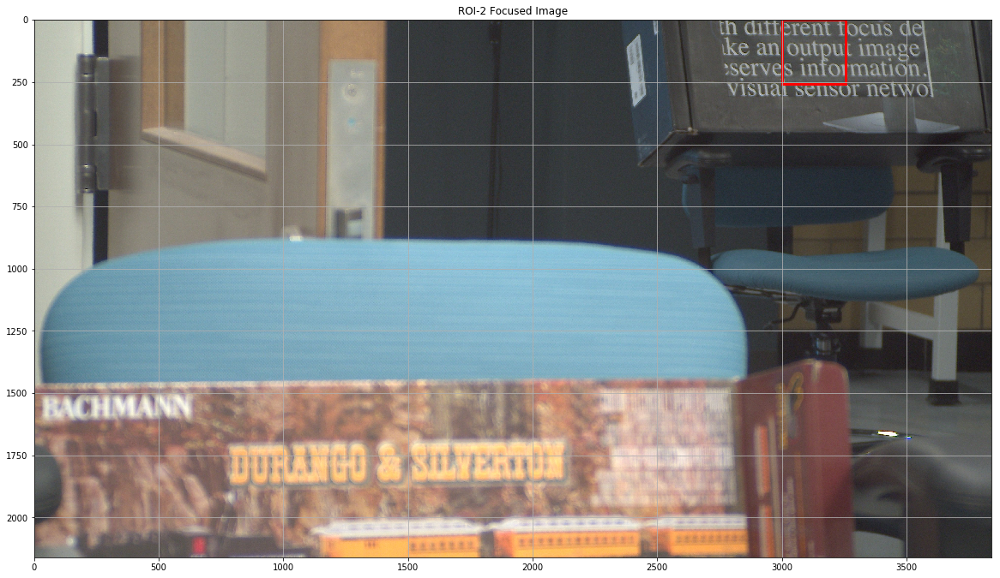

In [227]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry2, rx2),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-2 Focused Image")

The algorithm predicts that the initial image at focus motor position 1100 is in focus and takes 0 steps. The letters in the ROI are clear so this is an acceptable result.

### ROI-3

In [217]:
# Region 3
rx3= 600; ry3=1100

rh3,prh3,poh3 = autofocus_dnn(rx3, ry3, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 201
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 201"
Taking a step forward
Attempt: 1/4, AbsPos: 1301, Pred: 137
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -137"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 274"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -274"
Attempt: 2/4, AbsPos: 1164, Pred: 28
Found a good focus point. Done


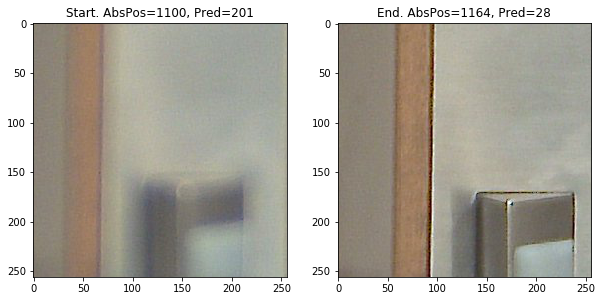

In [218]:
plt.subplot(1,2,1)
plt.imshow(rh3[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh3[0],prh3[0]))
plt.subplot(1,2,2)
plt.imshow(rh3[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh3[-1],prh3[-1]))
plt.show()

Text(0.5,1,'ROI-3 Focused Image')

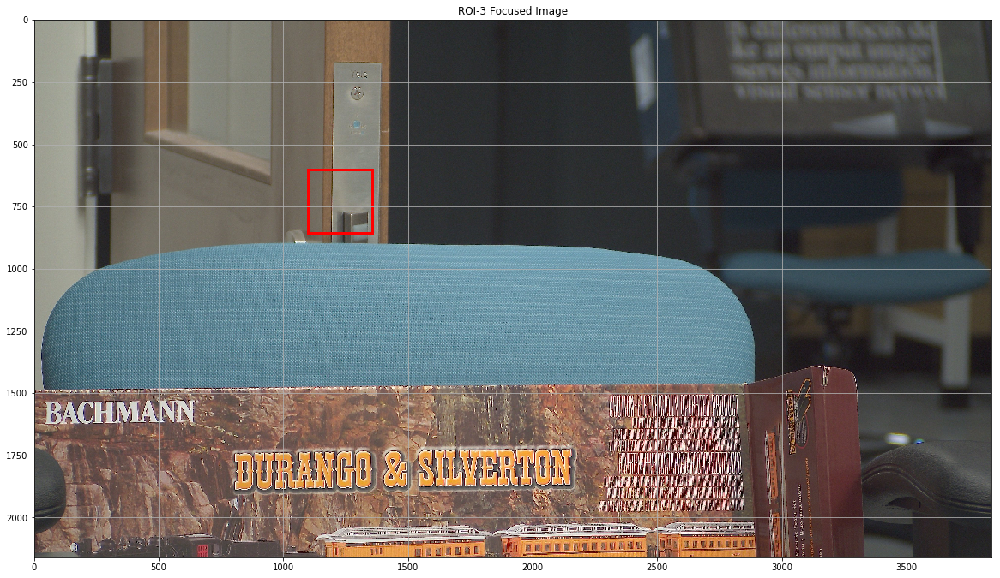

In [221]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry3, rx3),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-3 Focused Image")

The algorithm takes 3 steps before arriving at an acceptable focus. Again, the ROI is clear and the lines of the door lock are sharp and crisp. There are several colors and textures in this image and the algorithm can still focus correctly.

### ROI-4

In [232]:
# Region 4
rx4= 1500; ry4=300

rh4,prh4,poh4 = autofocus_dnn(rx4, ry4, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 323
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 323"
Taking a step forward
Attempt: 1/4, AbsPos: 1423, Pred: 206
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -206"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 412"
Taking a step backward
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -412"
Attempt: 2/4, AbsPos: 1217, Pred: 50
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -50"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 100"
Taking a step forward
Attempt: 3/4, AbsPos: 1267, Pred: 12
Found a good focus point. Done


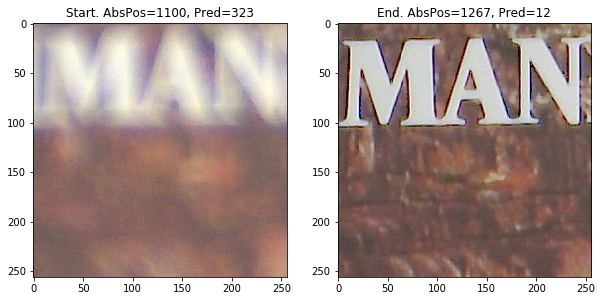

In [233]:
plt.subplot(1,2,1)
plt.imshow(rh4[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh4[0],prh4[0]))
plt.subplot(1,2,2)
plt.imshow(rh4[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh4[-1],prh4[-1]))
plt.show()

Text(0.5,1,'ROI-4 Focused Image')

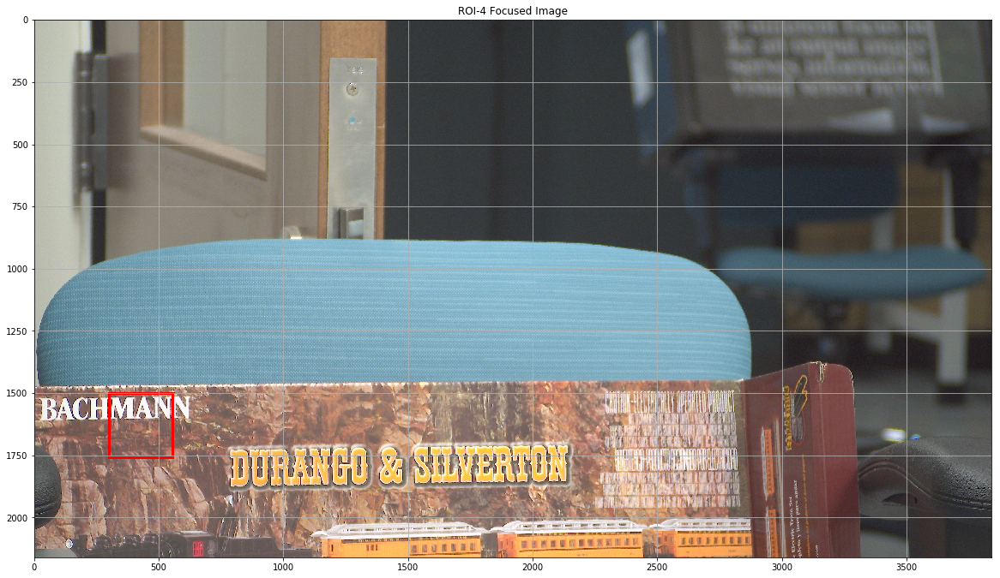

In [234]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry4, rx4),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-4 Focused Image")

Similarly to the other letter based ROI, the algorithm is able to find a good focus position for this ROI. However, for this, the algorithm uses all 4 steps, but the resulting ROI is clear.

### ROI-5

In [250]:
# Region 5
rx5= 1900; ry5=2000

rh5,prh5,poh5 = autofocus_dnn(rx5, ry5, 4)

Setting initial focus position
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/resetFocusMotor.py 1"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 160"
Attempt: 0/4, AbsPos: 1100, Pred: 82
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 82"
Taking a step forward
Attempt: 1/4, AbsPos: 1182, Pred: 49
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 -49"
ssh -i ~/.ssh/smartcamkey2 nvidia@10.236.176.37 "python2 ~/bin/moveFocusMotor.py 1 98"
Taking a step forward
Attempt: 2/4, AbsPos: 1231, Pred: 0
Found a good focus point. Done


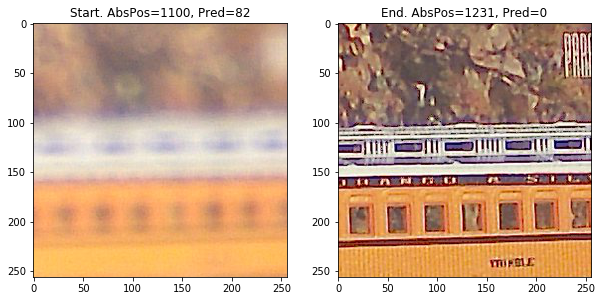

In [251]:
plt.subplot(1,2,1)
plt.imshow(rh5[0].transpose(1,2,0))
plt.title("Start. AbsPos={}, Pred={}".format(poh5[0],prh5[0]))
plt.subplot(1,2,2)
plt.imshow(rh5[-1].transpose(1,2,0))
plt.title("End. AbsPos={}, Pred={}".format(poh5[-1],prh5[-1]))
plt.show()

Text(0.5,1,'ROI-5 Focused Image')

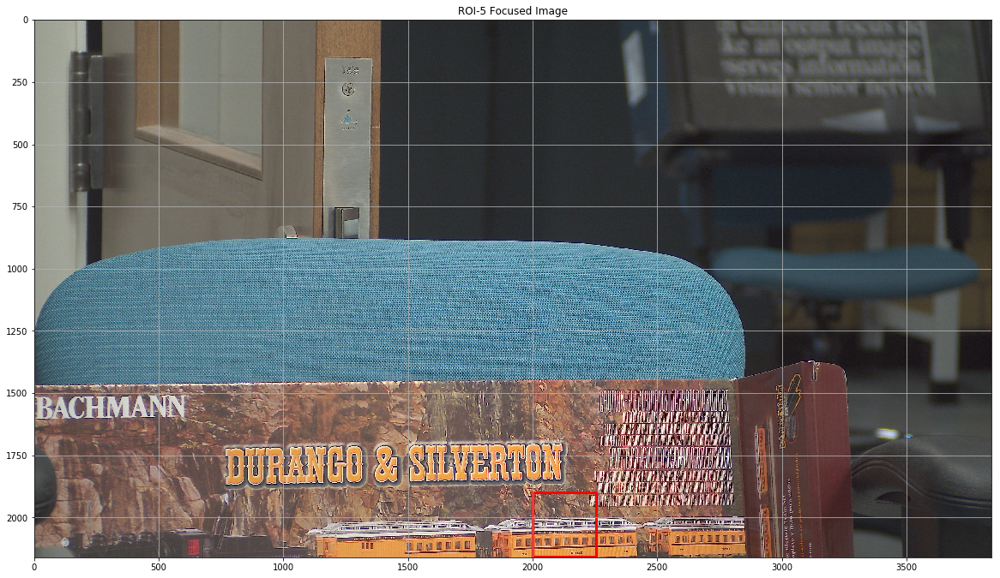

In [252]:
curr_img = grabImage(imres=8)
plt.figure(figsize=(20,20))
plt.imshow(curr_img)
plt.gca().add_patch(plt.Rectangle((ry5, rx5),256,256,fill=False,edgecolor='r', linewidth=3))
plt.grid(True)
plt.title("ROI-5 Focused Image")

This ROI includes much different texture and structure that the other ROIs and the algorithm is still able to focus properly.

## Conclusions

Overall the neural focus algorithm has shown to work well. Recall, from homework 2 we wrote an iterative focus algorithm where for every image we stepped across the whole range of possible focus positions and afterwards chose the sharpest image. The found images were high quality but that was a brute force way to select a focus position. Here, in all cases we are able to find the correct focus position in less than 4 steps. Clearly, a DNN based focus mechanism is a good idea. However, there are still some areas for improvement:

1. Train a better model to almost always find the correct focus in 1 step
2. Train a model that can tell what direction to move as well as how far
3. Improve the DNN autofocus algorithm so that we do not always have to look forward and backward